In [1]:
!pip install ultralytics wandb -q

import os
import shutil
import glob
import cv2
import numpy as np
import yaml
import random
import matplotlib.pyplot as plt
import json
import pandas as pd
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
import wandb
from tqdm.notebook import tqdm 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 17.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 28.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.9 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 

THis cell defines all the necessary paths and parameters for the entire workflow. This includes input data locations, output directories for processed data and results, Centroid Cropping (CCS) settings (like crop size, whether to apply CLAHE), training hyperparameters (model choice, epochs, batch size, learning rate)

In [2]:
orig_image_dir = '/kaggle/input/cavity/def-images-20250415T155900Z-001/def-images'
orig_mask_dir = '/kaggle/input/cavity/maks_images-20250415T155946Z-001/maks_images'

base_working_dir = '/kaggle/working/'
ccs_output_dir = os.path.join(base_working_dir, 'ccs_dataset')
output_dir_ccs_yolo = os.path.join(base_working_dir, 'ccs_yolo_dataset')
training_runs_dir = os.path.join(base_working_dir, 'yolo_training_runs')

crop_size = 512
min_contour_area = 10
handle_no_cavity = 'skip'
apply_clahe = True
clahe_clip_limit = 2.0
clahe_tile_grid_size = (8, 8)

train_ratio = 0.8
model_to_train = 'yolov8n-seg.pt'
train_epochs = 300
train_patience = 50
train_batch_size = 4
train_lr0 = 0.0005

wandb_project = "dental-cavity-segmentation-ccs"
run_name = f"nooo-ccs_{model_to_train.replace('.pt', '')}_crop{crop_size}_clahe{apply_clahe}_lr{train_lr0}_ep{train_epochs}"

os.makedirs(ccs_output_dir, exist_ok=True)
os.makedirs(output_dir_ccs_yolo, exist_ok=True)
os.makedirs(training_runs_dir, exist_ok=True)

run_config = {
    "orig_image_dir": orig_image_dir, "orig_mask_dir": orig_mask_dir,
    "crop_size": crop_size, "min_contour_area": min_contour_area,
    "handle_no_cavity": handle_no_cavity, "apply_clahe": apply_clahe,
    "clahe_clip_limit": clahe_clip_limit if apply_clahe else None,
    "clahe_tile_grid_size": clahe_tile_grid_size if apply_clahe else None,
    "train_ratio": train_ratio, "model_to_train": model_to_train,
    "train_epochs": train_epochs, "train_patience": train_patience,
    "train_batch_size": train_batch_size, "train_lr0": train_lr0,
}

for key, val in run_config.items(): print(f"  {key}: {val}")


  orig_image_dir: /kaggle/input/cavity/def-images-20250415T155900Z-001/def-images
  orig_mask_dir: /kaggle/input/cavity/maks_images-20250415T155946Z-001/maks_images
  crop_size: 512
  min_contour_area: 10
  handle_no_cavity: skip
  apply_clahe: True
  clahe_clip_limit: 2.0
  clahe_tile_grid_size: (8, 8)
  train_ratio: 0.8
  model_to_train: yolov8n-seg.pt
  train_epochs: 300
  train_patience: 50
  train_batch_size: 4
  train_lr0: 0.0005


Here Im applying the Centroid Cropping and Sampling strategy. It loops through the original images, reads the corresponding masks, and finds cavity contours. If cavities are found, it calculates their center and extracts a square patch around this center from both the image and the mask. Saves the cropped images and masks to the `ccs_dataset` directory and records the top-left coordinate of each crop in `crop_coords.json`. Images without valid cavities are skipped.

In [3]:
ccs_image_dir = os.path.join(ccs_output_dir, 'images')
ccs_mask_dir = os.path.join(ccs_output_dir, 'masks')
os.makedirs(ccs_image_dir, exist_ok=True)
os.makedirs(ccs_mask_dir, exist_ok=True)
processed_count = 0
skipped_no_cavity = 0
skipped_error = 0
crop_coords_dict = {}

original_image_files = sorted(glob.glob(os.path.join(orig_image_dir, '*.jpg')))

if not original_image_files:
    print(f"\nError: No JPG images found in {orig_image_dir}.")
else:
    print(f"Found {len(original_image_files)} original images.")

    if apply_clahe:
        clahe = cv2.createCLAHE(clipLimit=clahe_clip_limit, tileGridSize=clahe_tile_grid_size)

    for img_path in tqdm(original_image_files, desc="preprocessing Images"):
        base_filename = os.path.basename(img_path)
        name, _ = os.path.splitext(base_filename)
        mask_filename = f"{name}.png"
        mask_path = os.path.join(orig_mask_dir, mask_filename)

        if not os.path.exists(mask_path):
            skipped_error += 1; continue

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None: skipped_error += 1; continue

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        valid_contours = [cnt for cnt in contours if cv2.contourArea(cnt) >= min_contour_area]

        if not valid_contours:
            skipped_no_cavity += 1; continue

        all_points = np.vstack(valid_contours)
        x, y, w, h = cv2.boundingRect(all_points)
        center_x = x + w / 2
        center_y = y + h / 2

        image_bgr = cv2.imread(img_path)
        if image_bgr is None: skipped_error += 1; continue
        img_h, img_w = image_bgr.shape[:2]

        if img_w < crop_size or img_h < crop_size:
            skipped_error += 1; continue

        image_to_crop = image_bgr
        if apply_clahe:
            gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
            clahe_img = clahe.apply(gray)
            image_to_crop = cv2.cvtColor(clahe_img, cv2.COLOR_GRAY2BGR)

        crop_x1 = int(center_x - crop_size / 2)
        crop_y1 = int(center_y - crop_size / 2)
        crop_x1 = max(0, min(crop_x1, img_w - crop_size))
        crop_y1 = max(0, min(crop_y1, img_h - crop_size))
        crop_x2 = crop_x1 + crop_size
        crop_y2 = crop_y1 + crop_size

        cropped_image = image_to_crop[crop_y1:crop_y2, crop_x1:crop_x2]
        cropped_mask = mask[crop_y1:crop_y2, crop_x1:crop_x2]

        if cropped_image.shape[0] == crop_size and cropped_image.shape[1] == crop_size:
            cv2.imwrite(os.path.join(ccs_image_dir, base_filename), cropped_image)
            cv2.imwrite(os.path.join(ccs_mask_dir, mask_filename), cropped_mask)
            crop_coords_dict[name] = (crop_x1, crop_y1)
            processed_count += 1
        else:
             skipped_error += 1
    print(f"successfullyy processed/cropped: {processed_count}")

    if processed_count > 0:
        coords_save_path = os.path.join(ccs_output_dir, 'crop_coords.json')
        with open(coords_save_path, 'w') as f:
             json.dump(crop_coords_dict, f, indent=4)
        print(f"\nsaved crop coordinates to: {coords_save_path}")
    else:
        print("\nfailed")

Found 300 original images.


preprocessing Images:   0%|          | 0/300 [00:00<?, ?it/s]

successfullyy processed/cropped: 300

saved crop coordinates to: /kaggle/working/ccs_dataset/crop_coords.json


Creates the YOLO format `.txt` label files required for training, based on the *cropped* masks generated previously. It iterates through the cropped masks, finds cavity contours within each crop, normalizes the contour coordinates relative to the crop size, and saves them in the required format to a temporary label directory (`labels_temp`).

In [4]:
ccs_mask_dir = os.path.join(ccs_output_dir, 'masks')
ccs_label_dir_temp = os.path.join(ccs_output_dir, 'labels_temp')
os.makedirs(ccs_label_dir_temp, exist_ok=True)

processed_labels = 0
skipped_label_error = 0

cropped_mask_files = sorted(glob.glob(os.path.join(ccs_mask_dir, '*.png')))

if not cropped_mask_files:
    print(f"Error: No cropped masks found in {ccs_mask_dir}.")
else:
    for mask_path in tqdm(cropped_mask_files, desc="Generating Labels"):
        base_filename_mask = os.path.basename(mask_path)
        name, _ = os.path.splitext(base_filename_mask)
        label_path = os.path.join(ccs_label_dir_temp, f"{name}.txt")

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None: skipped_label_error += 1; continue

        h, w = mask.shape
        if h == 0 or w == 0: skipped_label_error += 1; continue

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        yolo_format_lines = []
        if contours:
            for contour in contours:
                if cv2.contourArea(contour) < min_contour_area: continue
                if len(contour) < 3: continue

                polygon = contour.flatten().tolist()
                normalized_polygon = [f"{p/(w if i%2==0 else h):.6f}" for i, p in enumerate(polygon)]
                yolo_format_lines.append(f"0 {' '.join(normalized_polygon)}")

        with open(label_path, 'w') as f:
            f.write('\n'.join(yolo_format_lines))
        processed_labels += 1

    print(f"labels generated: {processed_labels}")


Generating Labels:   0%|          | 0/300 [00:00<?, ?it/s]

labels generated: 300



This cell prepares the final dataset for YOLO training and gathers necessary information for later evaluation. It loads the crop coordinates saved in Cell 3, then creates a list matching each processed cropped image with its corresponding temporary label, original image path, original mask path, and crop coordinates. This list is split into training and validation sets. 

In [5]:
ccs_image_dir = os.path.join(ccs_output_dir, 'images')
ccs_label_dir_temp = os.path.join(ccs_output_dir, 'labels_temp')

train_img_dir_final = os.path.join(output_dir_ccs_yolo, 'images/train')
val_img_dir_final = os.path.join(output_dir_ccs_yolo, 'images/val')
train_lbl_dir_final = os.path.join(output_dir_ccs_yolo, 'labels/train')
val_lbl_dir_final = os.path.join(output_dir_ccs_yolo, 'labels/val')

os.makedirs(train_img_dir_final, exist_ok=True)
os.makedirs(val_img_dir_final, exist_ok=True)
os.makedirs(train_lbl_dir_final, exist_ok=True)
os.makedirs(val_lbl_dir_final, exist_ok=True)

coords_save_path = os.path.join(ccs_output_dir, 'crop_coords.json')
crop_coords_dict = {}

with open(coords_save_path, 'r') as f:
    crop_coords_dict = json.load(f)

all_ccs_images = sorted(glob.glob(os.path.join(ccs_image_dir, '*.jpg')))

all_data_tuples = []
skipped_count = 0

for ccs_img_path in tqdm(all_ccs_images, desc="gathering data"):
    base_filename = os.path.basename(ccs_img_path)
    name, _ = os.path.splitext(base_filename)

    ccs_lbl_path = os.path.join(ccs_label_dir_temp, f"{name}.txt")
    original_img_path = os.path.join(orig_image_dir, f"{name}.jpg")
    original_mask_path = os.path.join(orig_mask_dir, f"{name}.png")

    if os.path.exists(ccs_lbl_path) and \
       os.path.exists(original_img_path) and \
       os.path.exists(original_mask_path) and \
       name in crop_coords_dict:
        coords = crop_coords_dict[name]
        all_data_tuples.append(
            (ccs_img_path, ccs_lbl_path, original_img_path, original_mask_path, coords)
        )
    else:
        skipped_count += 1

print(f"Created {len(all_data_tuples)} data tuples. Skipped {skipped_count} due to missing parts.")

if not all_data_tuples:
    print("Error: No data to split.")
else:
    train_data, val_data = train_test_split(
        all_data_tuples, test_size=(1.0 - train_ratio), random_state=42
    )
    print(f"split into {len(train_data)} train / {len(val_data)} validation samples.")

    train_image_paths = [item[0] for item in train_data]
    train_label_paths = [item[1] for item in train_data]
    val_image_paths = [item[0] for item in val_data]
    val_label_paths = [item[1] for item in val_data]
    val_orig_img_paths = [item[2] for item in val_data]
    val_orig_mask_paths = [item[3] for item in val_data]
    val_crop_coords = [item[4] for item in val_data]

    globals()['val_image_paths'] = val_image_paths
    globals()['val_orig_mask_paths'] = val_orig_mask_paths
    globals()['val_crop_coords'] = val_crop_coords
    globals()['val_orig_img_paths'] = val_orig_img_paths
    print("Stored validation info globally.")

    def copy_files(file_list, dest_folder):
        copied_count = 0
        os.makedirs(dest_folder, exist_ok=True)
        for file_path in file_list:
            if os.path.exists(file_path):
                shutil.copy(file_path, dest_folder); copied_count += 1
        return copied_count

    copy_files(train_image_paths, train_img_dir_final)
    copy_files(val_image_paths, val_img_dir_final)
    copy_files(train_label_paths, train_lbl_dir_final)
    copy_files(val_label_paths, val_lbl_dir_final)

    if os.path.exists(ccs_label_dir_temp):
        shutil.rmtree(ccs_label_dir_temp)

gathering data:   0%|          | 0/300 [00:00<?, ?it/s]

Created 300 data tuples. Skipped 0 due to missing parts.
split into 240 train / 60 validation samples.
Stored validation info globally.


Generates the `ccs_data.yaml` file required by YOLO to understand the dataset structure. This file tells the trainer where to find the training and validation images within the `ccs_yolo_dataset` folder, specifies the number of classes (1), and lists the class name ('cavity').

In [6]:
ccs_yaml_path = os.path.join(output_dir_ccs_yolo, 'ccs_data.yaml')

data_yaml_ccs = {
    'path': os.path.abspath(output_dir_ccs_yolo),
    'train': 'images/train',
    'val': 'images/val',
    'nc': 1,
    'names': ['cavity']
}

with open(ccs_yaml_path, 'w') as f:
    yaml.dump(data_yaml_ccs, f, default_flow_style=False, sort_keys=False)

print(f"\nccs_data.yaml created at: {ccs_yaml_path}")
print(yaml.dump(data_yaml_ccs))


ccs_data.yaml created at: /kaggle/working/ccs_yolo_dataset/ccs_data.yaml
names:
- cavity
nc: 1
path: /kaggle/working/ccs_yolo_dataset
train: images/train
val: images/val



In [7]:
# Cell 7: Initialize Weights & Biases (Using Kaggle Secrets)

import wandb
from kaggle_secrets import UserSecretsClient # Import Kaggle secrets client

user_secrets = UserSecretsClient()
wandb_api_key = user_secrets.get_secret("WANDB_API_KEY") # Get key stored with label "WANDB_API_KEY"
wandb.login(key=wandb_api_key)
print("Wandb login successful using Kaggle secret.")
wandb_login_success = True



run = None # Initialize run variable
if wandb_login_success: # Only init if login seemed successful or anonymous is allowed
    # Ensure run_config dictionary is available from Cell 2
    if 'run_config' not in globals():
        print("Error: run_config not found. Re-run Cell 2.")
        # Add fallback definition if needed
        run_config = {"crop_size": crop_size, "model": model_to_train} # Minimal example
    try:
        run = wandb.init(
            project=wandb_project,
            name=run_name,
            config=run_config
        )
        print(f"Wandb run initialized. Project: {wandb_project}, Run: {run_name}")
        if run: print(f"Track run at: {run.url}") # Check if run object is valid
    except Exception as e:
        print(f"Error initializing wandb run: {e}")
        run = None # Ensure run is None on failure
else:
     print("skipping Wandb run initialization due to login failure.")

globals()['run'] = run

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: pirajeshmr (pirajesh1) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


Wandb login successful using Kaggle secret.


Wandb run initialized. Project: dental-cavity-segmentation-ccs, Run: nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300
Track run at: https://wandb.ai/pirajesh1/dental-cavity-segmentation-ccs/runs/qm3qvqbx


In [8]:
import ultralytics
ultralytics.settings.update({'wandb': True})


This cell executes the main model training using the prepared CCS dataset. It loads the specified pre-trained YOLOv8 model and calls the `train` function, providing the path to the `ccs_data.yaml`, the number of epochs, the image size (set to match the `crop_size`), batch size, early stopping patience, initial learning rate, and project/run names. As Wandb was initialized previously, YOLO automatically logs training progress (losses, metrics) to the specified Wandb run. Upon completion, it saves the best model weights and results locally and finishes the Wandb run.

In [9]:
print(f"\nStarting training run: {run_name}")
print(f"Using model: {model_to_train}, Image size: {crop_size}, Epochs: {train_epochs}, Batch: {train_batch_size}, LR: {train_lr0}")

model = YOLO(model_to_train)
results_save_dir = None # Initialize

results_ccs = model.train(
    data=ccs_yaml_path,
    epochs=train_epochs,
    imgsz=crop_size,
    batch=train_batch_size,
    patience=train_patience,
    project=training_runs_dir,
    name=run_name,
    lr0 = train_lr0,
    exist_ok=False
)

results_save_dir = results_ccs.save_dir
print(f"\ntraining complete. Results saved in: {results_save_dir}")

# Finish Wandb Run
if run:
    print(f"Finishing Wandb run: {run.url}")
    wandb.finish()

# Store path globally
if results_save_dir:
    globals()['results_save_dir'] = results_save_dir


Starting training run: nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300
Using model: yolov8n-seg.pt, Image size: 512, Epochs: 300, Batch: 4, LR: 0.0005


100%|██████████| 6.74M/6.74M [00:00<00:00, 87.0MB/s]


Ultralytics 8.3.112 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/kaggle/working/ccs_yolo_dataset/ccs_data.yaml, epochs=300, time=None, patience=50, batch=4, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=/kaggle/working/yolo_training_runs, name=nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=F

100%|██████████| 755k/755k [00:00<00:00, 16.2MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 69.8MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1565.8±568.7 MB/s, size: 70.9 KB)


train: Scanning /kaggle/working/ccs_yolo_dataset/labels/train... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<00:00, 1012.99it/s]

train: New cache created: /kaggle/working/ccs_yolo_dataset/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 720.7±551.2 MB/s, size: 77.4 KB)


val: Scanning /kaggle/working/ccs_yolo_dataset/labels/val... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 914.34it/s]

val: New cache created: /kaggle/working/ccs_yolo_dataset/labels/val.cache


Plotting labels to /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/300     0.502G      2.281      4.802      4.073      2.051          8        512: 100%|██████████| 60/60 [00:08<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.94it/s]

                   all         60         62    0.00278      0.806     0.0155    0.00505     0.0015      0.435    0.00354    0.00145



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/300     0.576G      2.173      3.742      3.659      1.851          8        512: 100%|██████████| 60/60 [00:05<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.99it/s]

                   all         60         62     0.0648     0.0968     0.0588     0.0254     0.0895      0.113     0.0517     0.0151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/300     0.578G      2.251      3.584      3.536      1.969          5        512: 100%|██████████| 60/60 [00:05<00:00, 11.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.10it/s]

                   all         60         62       0.13     0.0747     0.0254      0.013       0.13     0.0968     0.0241    0.00715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/300      0.58G      2.314      3.882      3.548      2.035          6        512: 100%|██████████| 60/60 [00:05<00:00, 10.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.47it/s]

                   all         60         62     0.0483      0.226     0.0245    0.00799     0.0394      0.161     0.0165    0.00539



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/300      0.58G      2.262      3.573      3.423      1.997         10        512: 100%|██████████| 60/60 [00:05<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.44it/s]

                   all         60         62     0.0989      0.177     0.0838     0.0229      0.108      0.194     0.0857     0.0236



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/300      0.58G      2.258      3.612      3.383      1.988          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.04it/s]

                   all         60         62     0.0804      0.242     0.0667     0.0231     0.0869      0.129     0.0545     0.0156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/300      0.58G       2.18      3.393      3.168      1.953          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.38it/s]

                   all         60         62      0.117      0.113     0.0502     0.0226      0.137      0.129     0.0642     0.0179



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/300      0.58G        2.2      3.513       3.36      1.917          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.21it/s]

                   all         60         62      0.148      0.145      0.104     0.0287      0.162      0.145      0.101     0.0247



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/300      0.58G      2.218       3.62      3.283      1.975          3        512: 100%|██████████| 60/60 [00:05<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.57it/s]

                   all         60         62      0.262     0.0968      0.106     0.0432      0.274     0.0968     0.0961     0.0301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/300      0.58G      2.214      3.585      2.969      1.971          8        512: 100%|██████████| 60/60 [00:05<00:00, 11.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.51it/s]

                   all         60         62      0.203      0.242     0.0982     0.0287      0.159       0.21     0.0821     0.0198



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/300      0.58G      2.169      3.403      2.967       1.94          6        512: 100%|██████████| 60/60 [00:04<00:00, 12.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.64it/s]

                   all         60         62      0.328      0.129      0.108     0.0407      0.287      0.113     0.0799     0.0274



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/300      0.58G      2.145      3.337      2.817      1.913          7        512: 100%|██████████| 60/60 [00:05<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.48it/s]

                   all         60         62      0.194       0.21      0.116     0.0447      0.218      0.226      0.122     0.0397



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/300      0.58G      2.151      3.487      2.855      1.928          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.20it/s]

                   all         60         62      0.131      0.355      0.122     0.0468      0.119      0.242       0.11     0.0429



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/300      0.58G      2.159      3.476      2.977      1.856          4        512: 100%|██████████| 60/60 [00:05<00:00, 10.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.66it/s]

                   all         60         62       0.14      0.194     0.0809     0.0295      0.117      0.161     0.0735     0.0233



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/300      0.58G      2.158      3.361      2.834      1.872          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.31it/s]

                   all         60         62      0.126      0.258     0.0978     0.0376      0.156      0.242     0.0963     0.0326



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/300      0.58G      2.134      3.487      2.952      1.884          1        512: 100%|██████████| 60/60 [00:05<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.27it/s]

                   all         60         62      0.171       0.21     0.0929     0.0353      0.156       0.21     0.0759     0.0225



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/300      0.58G      2.014      3.462      2.677      1.827          8        512: 100%|██████████| 60/60 [00:05<00:00, 11.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.00it/s]

                   all         60         62     0.0613       0.21      0.045     0.0189     0.0587      0.194     0.0378     0.0128



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/300      0.58G      2.025      3.342      2.697      1.815          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.13it/s]

                   all         60         62      0.477      0.226      0.239      0.103      0.231      0.306      0.195     0.0687



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/300      0.58G       1.96      3.232      2.638       1.77          7        512: 100%|██████████| 60/60 [00:05<00:00, 11.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.10it/s]

                   all         60         62      0.239      0.258      0.151     0.0683      0.231      0.242      0.127     0.0366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/300      0.58G      1.932      3.217      2.666      1.771          5        512: 100%|██████████| 60/60 [00:05<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.40it/s]

                   all         60         62       0.15       0.21      0.117     0.0496      0.181      0.194     0.0982     0.0358



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/300      0.58G      1.874      3.194       2.62      1.727          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.92it/s]

                   all         60         62      0.458      0.226      0.232     0.0811      0.456      0.226      0.195     0.0641



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/300      0.58G      1.906      3.288       2.57      1.786          5        512: 100%|██████████| 60/60 [00:04<00:00, 12.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.72it/s]

                   all         60         62      0.318      0.355      0.255     0.0947      0.289       0.21      0.174     0.0663



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/300      0.58G      1.898      3.143      2.564      1.764          8        512: 100%|██████████| 60/60 [00:04<00:00, 12.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.95it/s]

                   all         60         62      0.204      0.323      0.178     0.0749      0.187      0.323      0.159     0.0583



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/300      0.58G      1.927      3.252      2.574      1.779          7        512: 100%|██████████| 60/60 [00:05<00:00, 10.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.04it/s]

                   all         60         62      0.433      0.339      0.299      0.107      0.365       0.29      0.248     0.0935



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/300      0.58G      1.939      3.079      2.493      1.785          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.76it/s]

                   all         60         62      0.299      0.274      0.216      0.101      0.229       0.21      0.165      0.068



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/300      0.58G      1.853      3.078      2.497       1.69          3        512: 100%|██████████| 60/60 [00:05<00:00, 10.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.00it/s]

                   all         60         62      0.353      0.274      0.252     0.0925      0.332      0.258      0.212     0.0727



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/300      0.58G      1.959      3.281      2.598      1.748          8        512: 100%|██████████| 60/60 [00:05<00:00, 10.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.57it/s]

                   all         60         62      0.231       0.29      0.194     0.0817      0.186      0.274       0.16     0.0517



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/300      0.58G      1.849      3.111      2.467      1.703          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.41it/s]

                   all         60         62      0.232      0.194      0.168     0.0692       0.19       0.21      0.129     0.0404



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/300      0.58G      1.821      3.089      2.415       1.66          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.19it/s]

                   all         60         62      0.193      0.416      0.183     0.0795      0.177      0.387      0.164     0.0606



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/300      0.58G      1.844      3.056       2.33      1.679          2        512: 100%|██████████| 60/60 [00:05<00:00, 10.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.38it/s]

                   all         60         62      0.269       0.29      0.186     0.0741      0.221      0.258      0.157     0.0481



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/300      0.58G      1.765       3.03      2.206      1.662          7        512: 100%|██████████| 60/60 [00:05<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.05it/s]

                   all         60         62      0.359      0.194      0.257       0.11      0.209      0.242      0.226     0.0892



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/300      0.58G      1.791      2.996      2.307      1.699          8        512: 100%|██████████| 60/60 [00:05<00:00, 10.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.48it/s]

                   all         60         62      0.455      0.242      0.266      0.117      0.425      0.226      0.224        0.1



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/300      0.58G      1.804      2.931      2.267       1.69          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.93it/s]

                   all         60         62      0.243      0.306      0.178      0.071      0.271      0.323      0.187     0.0616



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/300      0.58G       1.71      2.956      2.211      1.594          3        512: 100%|██████████| 60/60 [00:05<00:00, 10.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.13it/s]

                   all         60         62      0.374      0.306       0.28      0.108      0.315      0.258      0.233      0.087



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/300      0.58G      1.797      2.995      2.327      1.652          7        512: 100%|██████████| 60/60 [00:05<00:00, 10.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.49it/s]

                   all         60         62      0.364      0.339      0.324      0.158      0.364      0.339      0.296      0.117



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/300      0.58G      1.716      2.922      2.166      1.608          7        512: 100%|██████████| 60/60 [00:05<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.47it/s]

                   all         60         62      0.287      0.419      0.334      0.139       0.25      0.435      0.291      0.113



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/300      0.58G      1.753      2.906      2.141      1.675          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.61it/s]

                   all         60         62      0.208       0.29      0.202     0.0882      0.222      0.306      0.187     0.0705



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/300      0.58G       1.78      2.871      2.121      1.633          6        512: 100%|██████████| 60/60 [00:05<00:00, 10.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.83it/s]

                   all         60         62      0.361      0.319      0.269       0.12      0.361      0.319      0.258      0.102



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/300      0.58G      1.846       2.83      2.214      1.706         12        512: 100%|██████████| 60/60 [00:05<00:00, 10.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.53it/s]

                   all         60         62      0.423      0.242      0.233      0.101      0.289       0.29      0.206     0.0891



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/300      0.58G       1.71      2.754       2.14      1.614          6        512: 100%|██████████| 60/60 [00:05<00:00, 10.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.44it/s]

                   all         60         62      0.354      0.339      0.288       0.14      0.387       0.29      0.272      0.114



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/300      0.58G      1.662      2.812      2.089      1.597          6        512: 100%|██████████| 60/60 [00:05<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.42it/s]

                   all         60         62      0.199      0.387      0.239      0.106      0.491      0.161      0.241     0.0923



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/300      0.58G      1.738      2.872       2.08      1.595          4        512: 100%|██████████| 60/60 [00:05<00:00, 10.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.62it/s]

                   all         60         62      0.246      0.371      0.214     0.0948      0.233      0.355      0.195     0.0798



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/300      0.58G       1.65      2.874      2.056      1.548          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 10.12it/s]

                   all         60         62      0.331      0.339      0.265      0.121      0.323      0.323      0.233     0.0999



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/300      0.58G      1.648      2.793       2.03      1.567          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.29it/s]

                   all         60         62      0.282      0.355      0.307      0.139      0.383       0.21       0.28      0.111



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/300      0.58G      1.743      2.972      2.101      1.632          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.41it/s]

                   all         60         62      0.397      0.329      0.261       0.11      0.286      0.419      0.221      0.084



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/300      0.58G      1.706      2.822      2.046      1.559         10        512: 100%|██████████| 60/60 [00:05<00:00, 10.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.64it/s]

                   all         60         62      0.241      0.387      0.244      0.108      0.257      0.306      0.235      0.094



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/300      0.58G      1.699      2.966      2.044      1.624          5        512: 100%|██████████| 60/60 [00:05<00:00, 10.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.04it/s]

                   all         60         62      0.527      0.323      0.346      0.156      0.495      0.316      0.312      0.119



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/300      0.58G      1.671      2.808      2.226      1.523          4        512: 100%|██████████| 60/60 [00:05<00:00, 10.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.11it/s]

                   all         60         62      0.437      0.355      0.315      0.131      0.386      0.323       0.29      0.117



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/300      0.58G      1.758      2.786      2.088      1.584          3        512: 100%|██████████| 60/60 [00:05<00:00, 10.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.76it/s]

                   all         60         62      0.365      0.288      0.235      0.102      0.381      0.274      0.226     0.0804



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/300      0.58G      1.599      2.779      1.989      1.542         13        512: 100%|██████████| 60/60 [00:05<00:00, 10.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.42it/s]

                   all         60         62      0.328      0.323      0.288      0.124      0.367      0.306      0.276      0.105



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/300      0.58G      1.644      2.741      1.944      1.543          9        512: 100%|██████████| 60/60 [00:05<00:00, 10.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.06it/s]

                   all         60         62      0.408      0.323      0.342      0.145      0.386      0.306      0.327      0.114



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/300      0.58G      1.643      2.683      1.905      1.549          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.48it/s]

                   all         60         62       0.41      0.323      0.303       0.12      0.279      0.323      0.229     0.0912



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/300      0.58G      1.675      2.603      2.017       1.54          5        512: 100%|██████████| 60/60 [00:05<00:00, 11.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 14.03it/s]

                   all         60         62      0.297      0.362      0.306      0.147      0.311      0.378      0.286      0.114



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/300      0.58G       1.59      2.712      1.925      1.519          6        512: 100%|██████████| 60/60 [00:04<00:00, 12.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.10it/s]

                   all         60         62      0.383       0.37      0.353       0.18      0.393      0.419      0.349      0.145



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/300      0.58G      1.617      2.741      1.917      1.537          8        512: 100%|██████████| 60/60 [00:04<00:00, 12.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.28it/s]

                   all         60         62      0.444       0.29      0.275       0.12      0.351      0.355      0.276     0.0914



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/300      0.58G      1.647      2.701       1.97      1.553          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.18it/s]

                   all         60         62      0.418      0.242      0.296      0.133      0.355       0.29      0.289      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/300      0.58G      1.653      2.728      1.986      1.534          8        512: 100%|██████████| 60/60 [00:05<00:00, 11.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.04it/s]

                   all         60         62      0.565      0.306      0.349      0.172      0.573       0.29      0.338      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/300      0.58G      1.636      2.789      1.957      1.545          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.45it/s]

                   all         60         62      0.362      0.403      0.387       0.18      0.526      0.323      0.374      0.156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/300      0.58G      1.531      2.683      1.782      1.486         11        512: 100%|██████████| 60/60 [00:05<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.44it/s]

                   all         60         62      0.358      0.355      0.325      0.159      0.342      0.339      0.308      0.131



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/300      0.58G      1.575      2.627      1.798       1.52          5        512: 100%|██████████| 60/60 [00:04<00:00, 12.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.55it/s]

                   all         60         62      0.584      0.363      0.391      0.178      0.542      0.339      0.353      0.147



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/300      0.58G      1.623      2.679      1.988      1.546          7        512: 100%|██████████| 60/60 [00:05<00:00, 11.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.36it/s]

                   all         60         62      0.449      0.387      0.367       0.18      0.449      0.387      0.357      0.164



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/300      0.58G      1.547      2.553      1.796      1.495          6        512: 100%|██████████| 60/60 [00:04<00:00, 12.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.74it/s]

                   all         60         62      0.405      0.323      0.356      0.177      0.469      0.387      0.384      0.154



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/300      0.58G      1.501      2.532      1.714       1.48          8        512: 100%|██████████| 60/60 [00:04<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.91it/s]

                   all         60         62      0.465      0.339      0.352      0.164      0.465      0.339      0.338      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/300      0.58G      1.553      2.531      1.839      1.467          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.86it/s]

                   all         60         62      0.382      0.468      0.416      0.222      0.526      0.387      0.404       0.18



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/300      0.58G      1.511      2.568      1.657      1.442          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.29it/s]

                   all         60         62      0.492      0.339      0.406      0.203      0.553      0.323      0.386      0.176



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/300      0.58G      1.524      2.594      1.705      1.482          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.21it/s]

                   all         60         62      0.249      0.323      0.275      0.142      0.254      0.339      0.262      0.118



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/300      0.58G      1.483      2.636      1.712      1.457          4        512: 100%|██████████| 60/60 [00:04<00:00, 12.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.53it/s]

                   all         60         62      0.367      0.323      0.311      0.152      0.339      0.306      0.293      0.109



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/300      0.58G      1.554      2.519      1.794      1.481          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.70it/s]

                   all         60         62      0.464      0.371      0.363      0.175      0.457       0.38       0.35      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/300      0.58G      1.564      2.511      1.776      1.506          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.13it/s]

                   all         60         62      0.439      0.417      0.306      0.159      0.416      0.403      0.303      0.125



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/300      0.58G      1.508      2.539      1.713       1.45          6        512: 100%|██████████| 60/60 [00:04<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.93it/s]

                   all         60         62      0.512      0.339      0.364      0.183      0.483      0.323      0.344      0.146



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/300      0.58G      1.467      2.494      1.579      1.432          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.13it/s]

                   all         60         62      0.488      0.353      0.364      0.162      0.479      0.355      0.356      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/300      0.58G      1.494      2.439       1.62       1.43          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.42it/s]

                   all         60         62      0.354      0.339      0.326       0.16      0.365      0.355      0.316      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/300      0.58G      1.512      2.525      1.549      1.467          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.67it/s]

                   all         60         62      0.258      0.435      0.304      0.156      0.386       0.29      0.296      0.123



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/300      0.58G      1.527      2.493      1.777      1.486          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.31it/s]

                   all         60         62      0.263      0.328      0.245      0.122       0.29      0.371      0.263      0.102



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/300      0.58G      1.523      2.528      1.618      1.462          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.91it/s]

                   all         60         62      0.368      0.339      0.329      0.163      0.337      0.323      0.306      0.134



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/300      0.58G      1.489      2.468      1.601      1.439          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.91it/s]

                   all         60         62      0.535      0.371      0.423      0.216      0.428      0.452      0.413      0.176



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/300      0.58G      1.464       2.41      1.674      1.452          7        512: 100%|██████████| 60/60 [00:05<00:00, 11.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.29it/s]

                   all         60         62      0.437      0.413      0.362      0.184      0.455      0.377      0.339       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/300      0.58G      1.535      2.522      1.671      1.448          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.95it/s]

                   all         60         62      0.373       0.29       0.33      0.186      0.418      0.323      0.336      0.141



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/300      0.58G      1.415      2.451      1.598      1.372          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.55it/s]

                   all         60         62       0.41      0.306      0.336      0.175      0.434      0.323      0.321      0.152



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/300      0.58G      1.406      2.335      1.562      1.409          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.59it/s]

                   all         60         62      0.329      0.371      0.311      0.155      0.401      0.274       0.28       0.12



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/300      0.58G      1.483      2.473      1.565      1.457         10        512: 100%|██████████| 60/60 [00:05<00:00, 11.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.83it/s]

                   all         60         62      0.296      0.414      0.319      0.157      0.381      0.371      0.324      0.131



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/300      0.58G      1.551      2.566      1.616      1.522          6        512: 100%|██████████| 60/60 [00:04<00:00, 12.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.77it/s]

                   all         60         62      0.409      0.371      0.326      0.171      0.388      0.371      0.308      0.118



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/300      0.58G      1.447      2.553      1.649      1.402          6        512: 100%|██████████| 60/60 [00:04<00:00, 12.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.18it/s]

                   all         60         62       0.49      0.387      0.385      0.195      0.468      0.371      0.362      0.148



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/300      0.58G      1.433      2.442       1.54      1.403          3        512: 100%|██████████| 60/60 [00:05<00:00, 11.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.26it/s]

                   all         60         62      0.338      0.404      0.331      0.183      0.343      0.387       0.31       0.14



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/300      0.58G      1.414      2.351      1.499      1.384          7        512: 100%|██████████| 60/60 [00:05<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.42it/s]

                   all         60         62      0.522      0.258       0.33       0.19      0.682      0.242      0.324      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/300      0.58G      1.502      2.486      1.601      1.435          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.28it/s]

                   all         60         62      0.416      0.355        0.3       0.16      0.378      0.323      0.274      0.116



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/300      0.58G      1.483      2.482      1.635      1.452          6        512: 100%|██████████| 60/60 [00:04<00:00, 12.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 14.25it/s]

                   all         60         62      0.464      0.468      0.409      0.213      0.466      0.451      0.397      0.166



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/300      0.58G      1.434       2.41      1.477      1.453          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.45it/s]

                   all         60         62      0.353      0.419      0.344       0.18      0.367      0.435      0.349      0.136



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/300      0.58G      1.371      2.415       1.52      1.355          4        512: 100%|██████████| 60/60 [00:04<00:00, 12.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.07it/s]

                   all         60         62      0.305      0.452      0.324      0.184      0.315        0.5      0.331      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/300      0.58G      1.403      2.454      1.517      1.349          7        512: 100%|██████████| 60/60 [00:05<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.18it/s]

                   all         60         62      0.378      0.274       0.27      0.131       0.41      0.306      0.273     0.0997



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/300      0.58G      1.463      2.493      1.534      1.442          5        512: 100%|██████████| 60/60 [00:05<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.28it/s]


                   all         60         62      0.453      0.387      0.361      0.181       0.53      0.339      0.343      0.134

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/300      0.58G      1.421      2.401      1.446      1.391          4        512: 100%|██████████| 60/60 [00:04<00:00, 12.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.62it/s]

                   all         60         62      0.365      0.468      0.357      0.172      0.328      0.419      0.286      0.117



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/300      0.58G      1.488       2.47      1.559      1.418          7        512: 100%|██████████| 60/60 [00:04<00:00, 12.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.99it/s]

                   all         60         62      0.388      0.403      0.362      0.193      0.361      0.371      0.333      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/300      0.58G      1.342      2.388       1.42      1.353          5        512: 100%|██████████| 60/60 [00:05<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.54it/s]

                   all         60         62      0.449      0.452      0.371      0.197      0.449      0.452      0.367      0.154



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/300      0.58G      1.335      2.252      1.387      1.336          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.49it/s]

                   all         60         62      0.515      0.419      0.381      0.207      0.519      0.419      0.362      0.165



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/300      0.58G      1.339      2.295      1.389      1.325          6        512: 100%|██████████| 60/60 [00:05<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.95it/s]

                   all         60         62      0.394      0.403      0.354      0.196      0.394      0.419      0.345      0.163



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/300      0.58G      1.332      2.312      1.431      1.317          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.81it/s]

                   all         60         62      0.409      0.452      0.371      0.194      0.358      0.419      0.349      0.154



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/300      0.58G      1.316      2.176      1.336      1.293          5        512: 100%|██████████| 60/60 [00:04<00:00, 12.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.74it/s]

                   all         60         62      0.507      0.387      0.406      0.213      0.712      0.274      0.392      0.176



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/300      0.58G      1.349      2.284      1.388      1.336          2        512: 100%|██████████| 60/60 [00:04<00:00, 12.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.46it/s]

                   all         60         62      0.561      0.323      0.398      0.214      0.535      0.306      0.376      0.169



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/300      0.58G      1.369      2.185      1.404      1.316          9        512: 100%|██████████| 60/60 [00:04<00:00, 12.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.84it/s]

                   all         60         62      0.378      0.355      0.361      0.195      0.358      0.339       0.33      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    101/300      0.58G      1.341      2.289      1.432      1.361         10        512: 100%|██████████| 60/60 [00:04<00:00, 12.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 11.47it/s]

                   all         60         62      0.475      0.452      0.399      0.204      0.482      0.403      0.357      0.161



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    102/300      0.58G      1.332      2.347      1.427      1.343          3        512: 100%|██████████| 60/60 [00:05<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.18it/s]

                   all         60         62      0.594      0.371      0.415      0.217      0.594      0.371      0.406      0.176



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    103/300      0.58G      1.375      2.374       1.39      1.336          3        512: 100%|██████████| 60/60 [00:04<00:00, 12.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.13it/s]

                   all         60         62       0.74      0.322      0.413      0.202      0.643       0.32      0.377      0.147



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    104/300      0.58G      1.339      2.212      1.294      1.338          4        512: 100%|██████████| 60/60 [00:05<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 12.87it/s]

                   all         60         62      0.511      0.419      0.368      0.193      0.473      0.387      0.329      0.137



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    105/300      0.58G       1.28      2.188       1.36      1.322         11        512: 100%|██████████| 60/60 [00:05<00:00, 11.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.12it/s]

                   all         60         62      0.419      0.387      0.358      0.187      0.449      0.339      0.338      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    106/300      0.58G       1.33      2.174      1.427      1.312          5        512: 100%|██████████| 60/60 [00:05<00:00, 11.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.20it/s]

                   all         60         62      0.329      0.452      0.345      0.176       0.32      0.452       0.32      0.138



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    107/300      0.58G      1.301      2.254      1.448      1.299          0        512: 100%|██████████| 60/60 [00:05<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.07it/s]

                   all         60         62      0.392      0.387       0.37      0.201      0.432      0.355      0.349      0.156



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    108/300      0.58G      1.366      2.368      1.523      1.366          7        512: 100%|██████████| 60/60 [00:05<00:00, 11.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.68it/s]

                   all         60         62      0.462      0.339      0.332      0.192      0.438      0.355      0.307      0.149



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    109/300      0.58G      1.302       2.17      1.321      1.313          5        512: 100%|██████████| 60/60 [00:04<00:00, 12.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.26it/s]

                   all         60         62       0.42      0.419      0.307      0.151      0.404      0.403      0.281      0.117



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    110/300      0.58G      1.288      2.219      1.328      1.289          7        512: 100%|██████████| 60/60 [00:04<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 14.08it/s]

                   all         60         62      0.497      0.371      0.393      0.221      0.475      0.355      0.366      0.158



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    111/300      0.58G      1.327      2.256      1.302      1.347          9        512: 100%|██████████| 60/60 [00:04<00:00, 12.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.81it/s]

                   all         60         62      0.468      0.435      0.416      0.208      0.449      0.419      0.382      0.164



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    112/300      0.58G       1.36      2.297      1.377      1.332         10        512: 100%|██████████| 60/60 [00:05<00:00, 11.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.29it/s]

                   all         60         62      0.399      0.419      0.411      0.219      0.435      0.371       0.38      0.167



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    113/300      0.58G      1.335      2.209      1.338      1.306          9        512: 100%|██████████| 60/60 [00:05<00:00, 11.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.04it/s]

                   all         60         62      0.514      0.355      0.407      0.215      0.412      0.362      0.352      0.142



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    114/300      0.58G      1.253       2.22      1.267      1.281          5        512: 100%|██████████| 60/60 [00:04<00:00, 12.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00, 13.56it/s]

                   all         60         62      0.508      0.371      0.426      0.213      0.586      0.323      0.404      0.177
EarlyStopping: Training stopped early as no improvement observed in last 50 epochs. Best results observed at epoch 64, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



114 epochs completed in 0.196 hours.
Optimizer stripped from /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300/weights/last.pt, 6.8MB
Optimizer stripped from /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300/weights/best.pt, 6.8MB

Validating /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300/weights/best.pt...
Ultralytics 8.3.112 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/8 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  25%|██▌       | 2/8 [00:00<00:00,  7.08it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.10it/s]


                   all         60         62      0.377      0.468      0.419      0.222      0.527      0.387      0.406      0.182


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.3ms preprocess, 4.0ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300


lr/pg0,███▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁
lr/pg1,▁█████▇▇▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▄▄▄
lr/pg2,████▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁
metrics/mAP50(B),▂▁▁▂▂▂▃▂▁▅▄▄▅▄▆▇▆▆▇▅▇█▅▇▇▆█▆▆▆▆▅▇▇████▇█
metrics/mAP50(M),▁▁▂▁▂▄▃▄▄▄▆▄▅▄▅▆▅▆▆▇▇▇▅▇▆▆▆█▇▆▆▅▇▇▇▆▇▆▆▇
metrics/mAP50-95(B),▂▁▁▁▁▂▂▃▄▃▅▃▆▅▅▄▅▅▄▇▇▆█▆▆▆▆▆▇▆▇█▇▇▇▇▇▇▇█
metrics/mAP50-95(M),▁▁▁▁▂▂▁▁▂▃▃▃▂▄▅▅▅▅▄▅▅▆▇▆▇▅▅▆▆▆▇▅▇▆▅▇▇▇▇█
metrics/precision(B),▁▁▂▂▂▄▂▄▃▂▃▃▂▅▃▄▄▄▅▅▄▄▆▅▃▃▆▄▃▅▄▃▄▄▆▆█▅▅▆
metrics/precision(M),▂▂▁▃▂▃▃▄▅▃▆▄▄▅▇▅▄▇▅▅▅▇▇▄▆▇▅▆▅▅▅▅▅▇▅█▆▆▆▇
metrics/recall(B),▁▄▂▁▂▆▃▄▄▅▅▅▃▄▆▆▅▆▆▇█▆▅▆▇▆▆▆▇▄█▅▇█▇▇█▇▆▇
metrics/recall(M),█▁▁▂▄▃▅▃▃▇▆▅▂▆▅▇▅▅▇▆▅▇▅▆▅▅▅▆▆▆▅██▇▅▆▆▆▆▆



training complete. Results saved in: /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300
Finishing Wandb run: https://wandb.ai/pirajesh1/dental-cavity-segmentation-ccs/runs/qm3qvqbx


Evaluates the best performing model checkpoint saved during training using YOLO's built-in validation method. It loads the `best.pt` model from the specific training run directory and runs `model.val()` on the validation dataset specified in the associated `ccs_data.yaml`.

In [10]:
if 'results_save_dir' not in globals() or not results_save_dir or not os.path.exists(results_save_dir):
     print("Error: Training results directory not found. Cannot evaluate.")
else:
    best_model_path = os.path.join(results_save_dir, 'weights/best.pt')

    if os.path.exists(best_model_path):
        print(f"\nLoading best model from: {best_model_path}")
        model_ccs = YOLO(best_model_path) 

        print("Evaluating on validation set")
        metrics_ccs = model_ccs.val(split='val', data=ccs_yaml_path)

        print("\n--- Validation Metrics ---")
        box_map50_95 = metrics_ccs.box.map
        box_map50 = metrics_ccs.box.map50
        mask_map50_95 = metrics_ccs.seg.map
        mask_map50 = metrics_ccs.seg.map50

        print(f"  Box mAP50-95:  {box_map50_95:.4f}")
        print(f"  Box mAP50:     {box_map50:.4f}")
        print(f"  Mask mAP50-95: {mask_map50_95:.4f}")
        print(f"  Mask mAP50:    {mask_map50:.4f}")
        print("-----------------------------------------")

        globals()['model_ccs'] = model_ccs # Store loaded model for next cell
        globals()['best_model_path'] = best_model_path # Store path

    else:
        print(f"Error: {best_model_path} not found.")

    print(f"\nDetailed results/plots saved in: {results_save_dir}")


Loading best model from: /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300/weights/best.pt
Evaluating on validation set
Ultralytics 8.3.112 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1983.0±507.7 MB/s, size: 75.2 KB)


val: Scanning /kaggle/working/ccs_yolo_dataset/labels/val.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:00<00:01,  2.73it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:00<00:01,  1.92it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]


                   all         60         62      0.384      0.468      0.418      0.222      0.535      0.387      0.406       0.18


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 2.9ms preprocess, 7.9ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/segment/val

--- Validation Metrics ---
  Box mAP50-95:  0.2221
  Box mAP50:     0.4185
  Mask mAP50-95: 0.1804
  Mask mAP50:    0.4064
-----------------------------------------

Detailed results/plots saved in: /kaggle/working/yolo_training_runs/nooo-ccs_yolov8n-seg_crop512_claheTrue_lr0.0005_ep300


Performs inference on a small sample of the cropped validation images using the best trained model.

Visualizations will be saved to: /kaggle/working/ccs_visualizations

Running inference, calculating metrics, saving & displaying visualizations for 20 sample crops...
Inference complete.


Processing Samples:   0%|          | 0/20 [00:00<?, ?it/s]


--- Processing Crop: image_5629.jpg ---
  Metrics (Crop): IoU=0.0000, Dice=0.0000, PixelAcc=0.9922


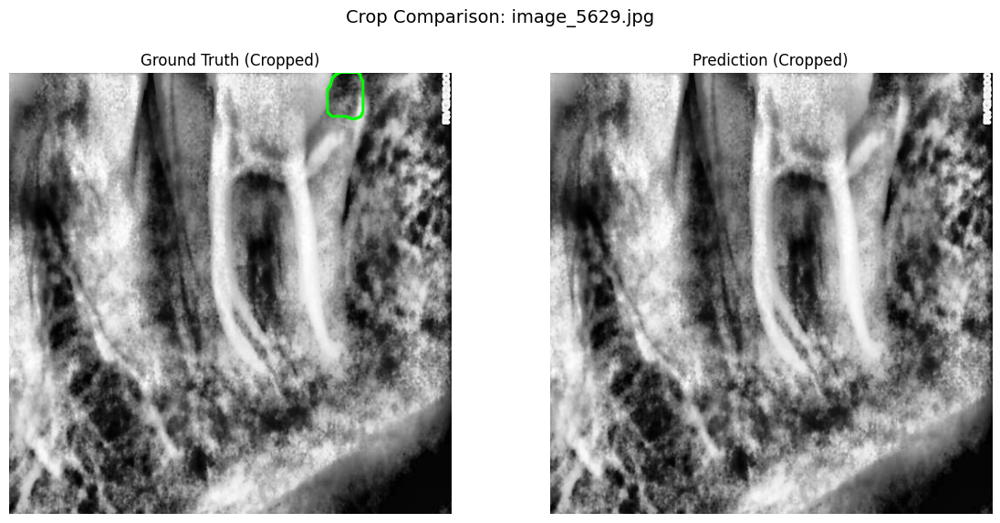


--- Processing Crop: image_5635.jpg ---
  Metrics (Crop): IoU=0.8502, Dice=0.9190, PixelAcc=0.9969


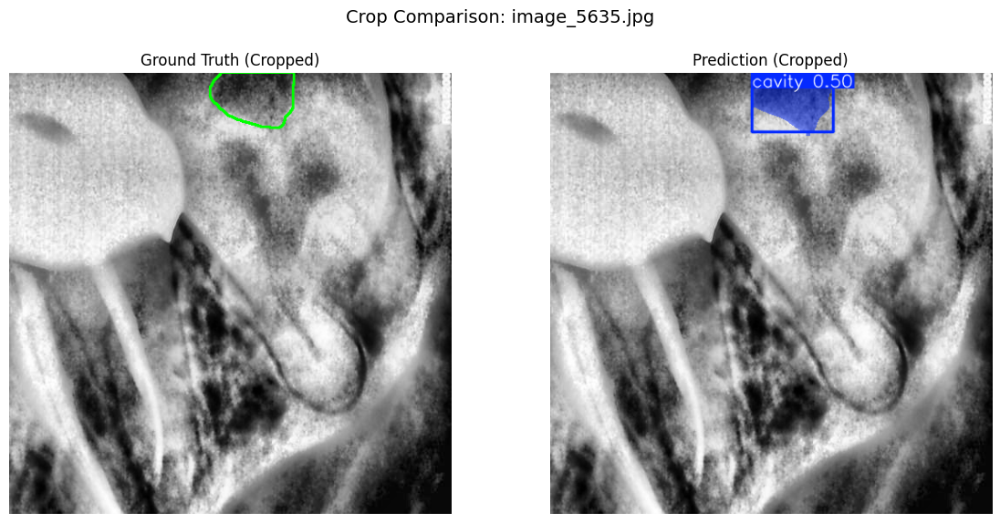


--- Processing Crop: image_5648.jpg ---
  Metrics (Crop): IoU=0.5933, Dice=0.7447, PixelAcc=0.9831


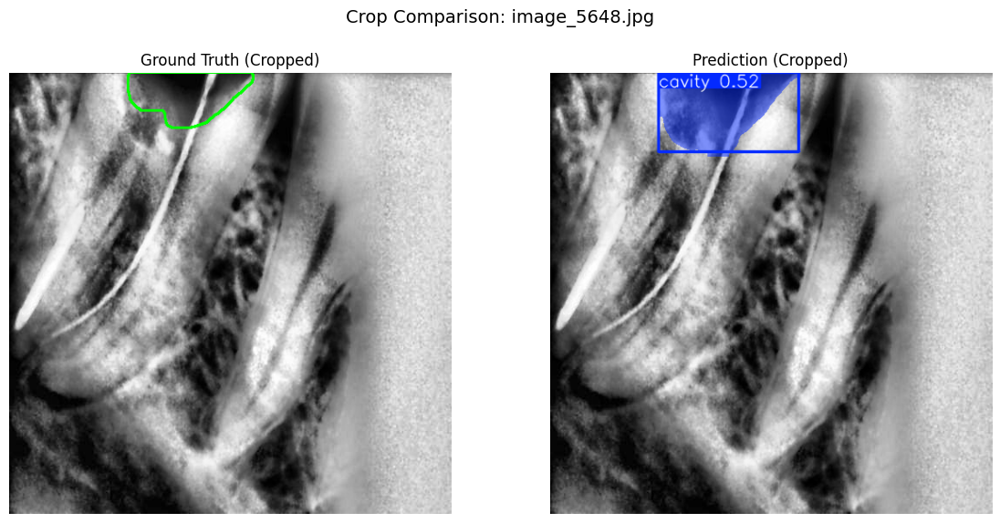


--- Processing Crop: image_5678.jpg ---
  Metrics (Crop): IoU=0.5066, Dice=0.6725, PixelAcc=0.9980


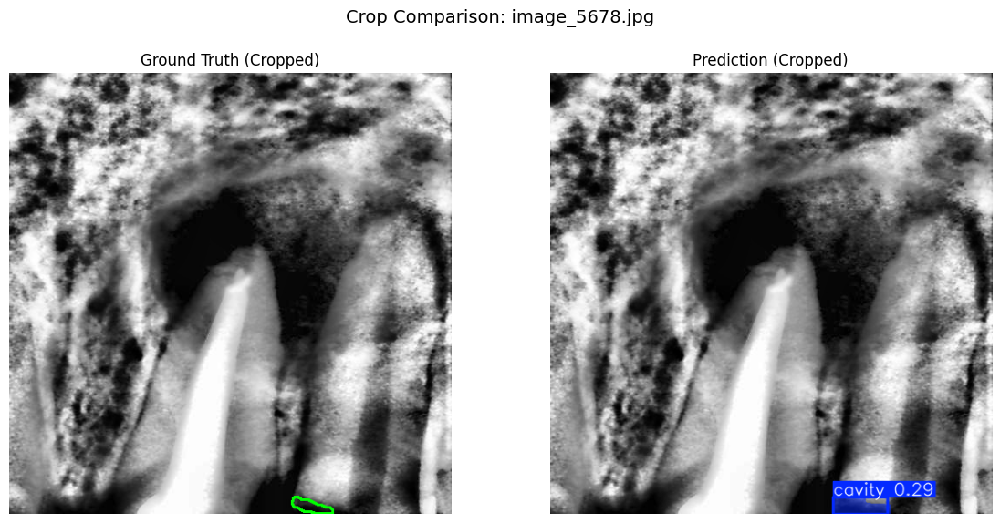


--- Processing Crop: image_5697.jpg ---
  Metrics (Crop): IoU=0.6131, Dice=0.7601, PixelAcc=0.9698


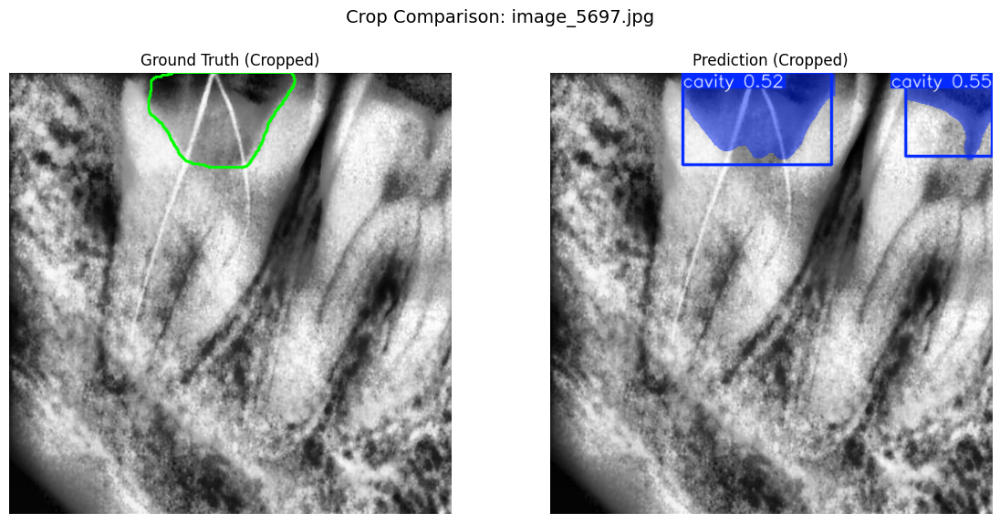


--- Processing Crop: image_5700.jpg ---
  Metrics (Crop): IoU=0.2289, Dice=0.3726, PixelAcc=0.9092


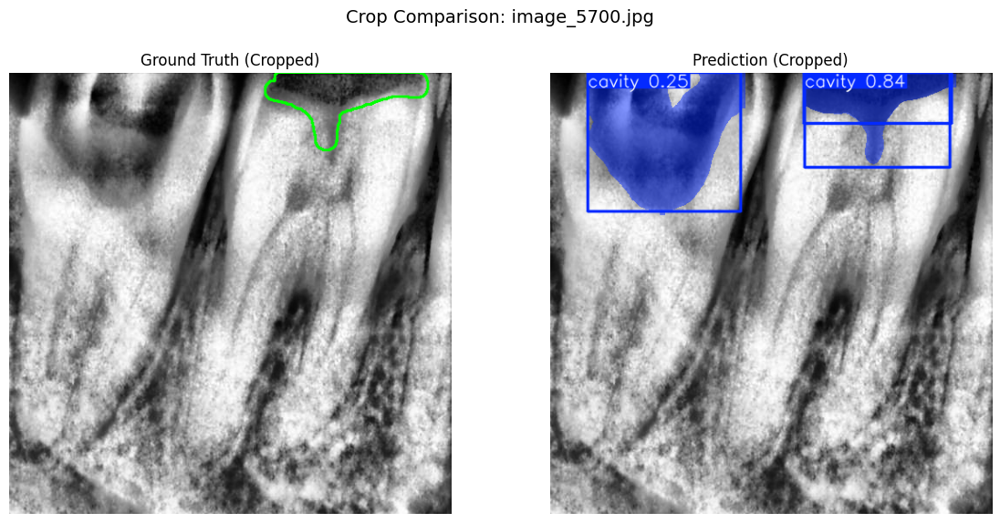


--- Processing Crop: image_5731.jpg ---
  Metrics (Crop): IoU=0.0183, Dice=0.0360, PixelAcc=0.9296


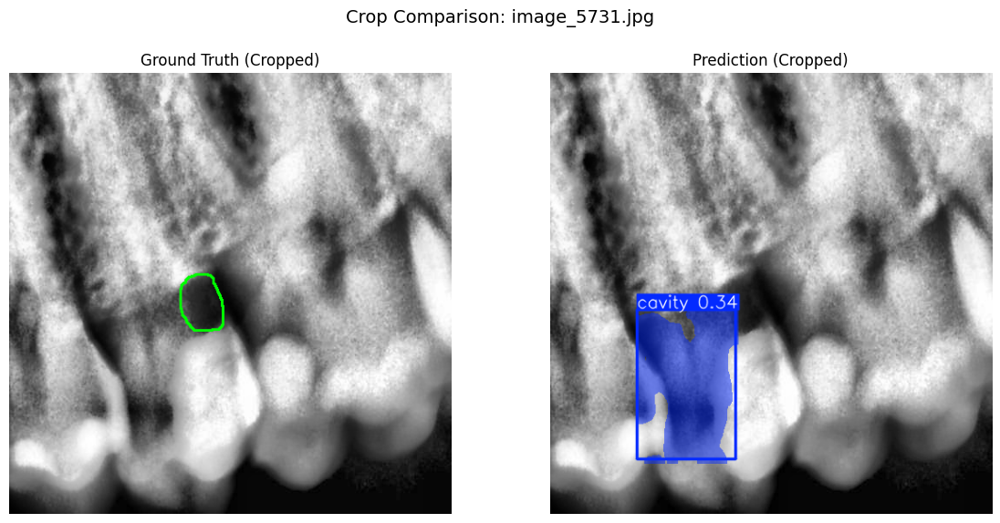


--- Processing Crop: image_5778.jpg ---
  Metrics (Crop): IoU=0.3785, Dice=0.5492, PixelAcc=0.9772


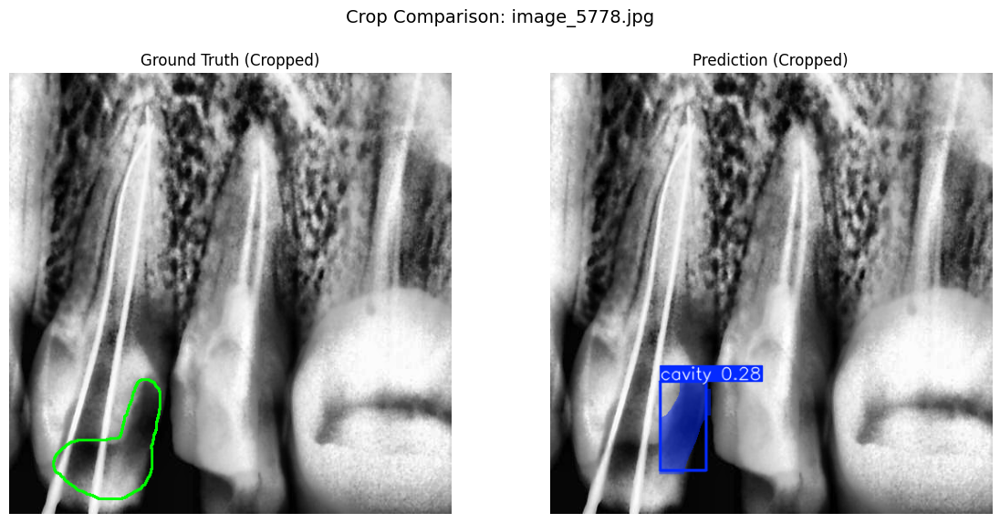


--- Processing Crop: image_5785.jpg ---
  Metrics (Crop): IoU=0.6239, Dice=0.7684, PixelAcc=0.9666


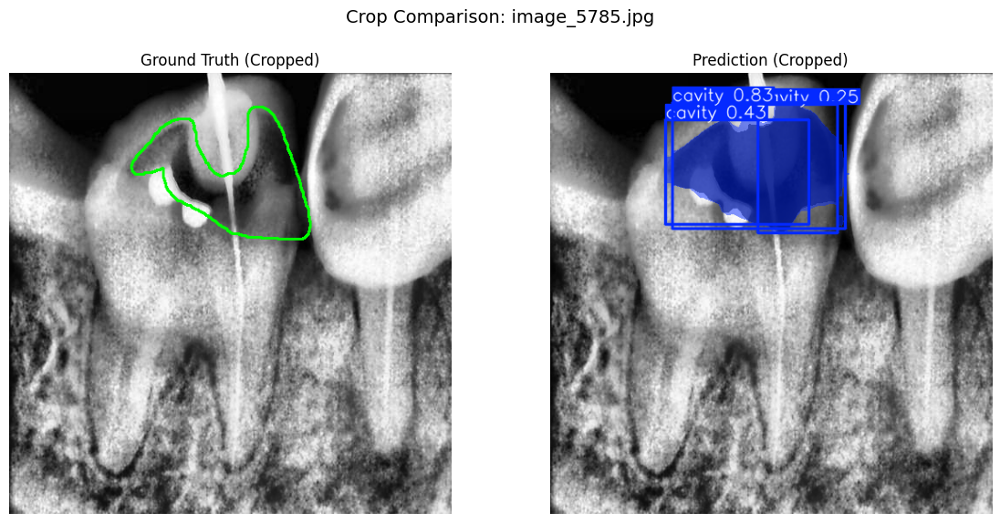


--- Processing Crop: image_5786.jpg ---
  Metrics (Crop): IoU=0.8560, Dice=0.9224, PixelAcc=0.9887


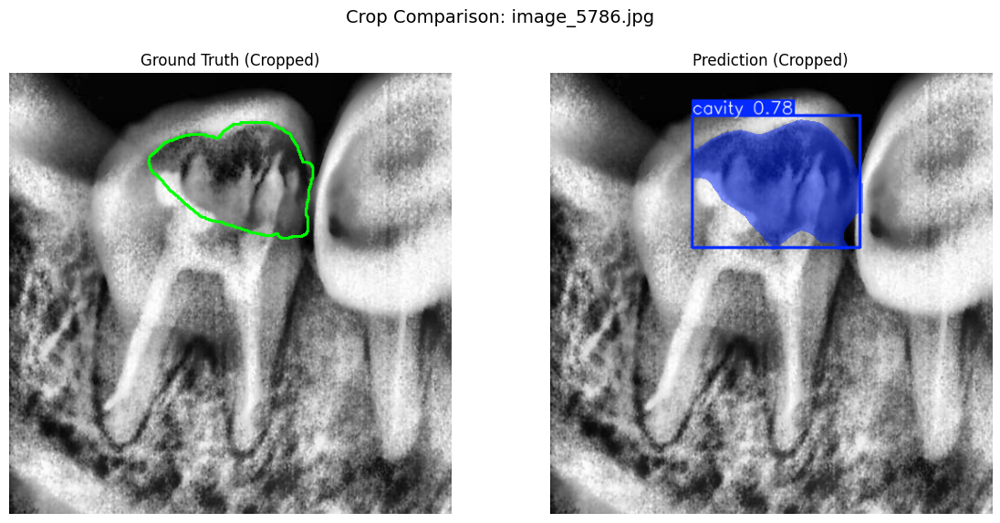


--- Processing Crop: image_5826.jpg ---
  Metrics (Crop): IoU=0.0000, Dice=0.0000, PixelAcc=0.9899


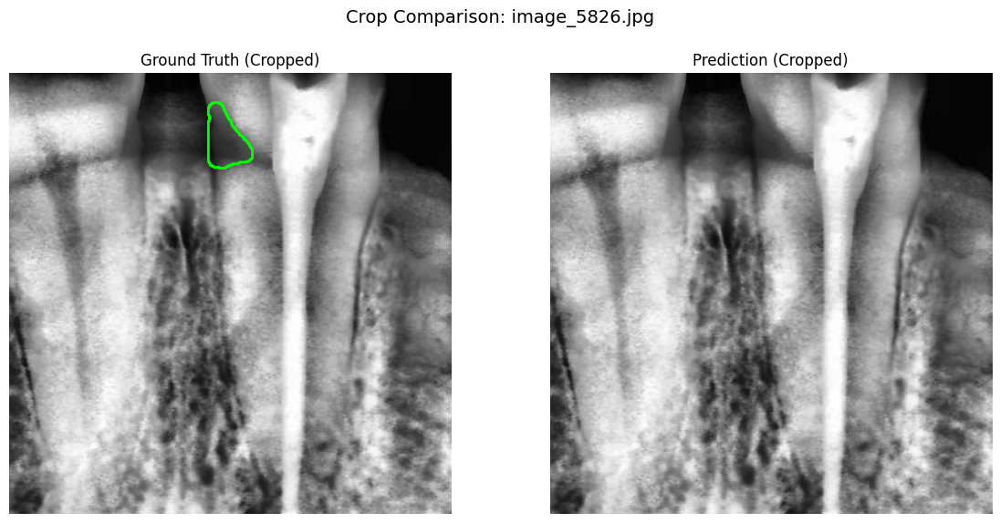


--- Processing Crop: image_5832.jpg ---
  Metrics (Crop): IoU=0.0000, Dice=0.0000, PixelAcc=0.9583


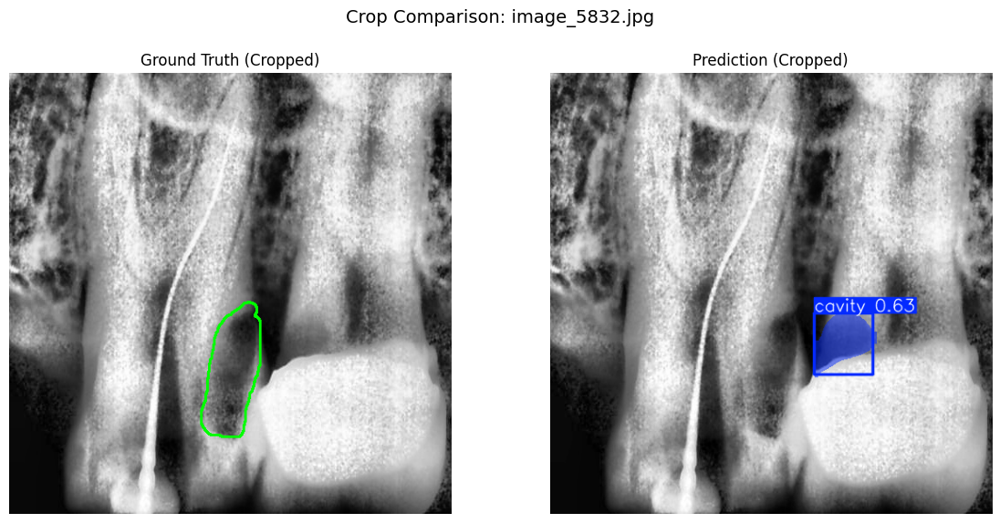


--- Processing Crop: image_5849.jpg ---
  Metrics (Crop): IoU=0.2127, Dice=0.3508, PixelAcc=0.9452


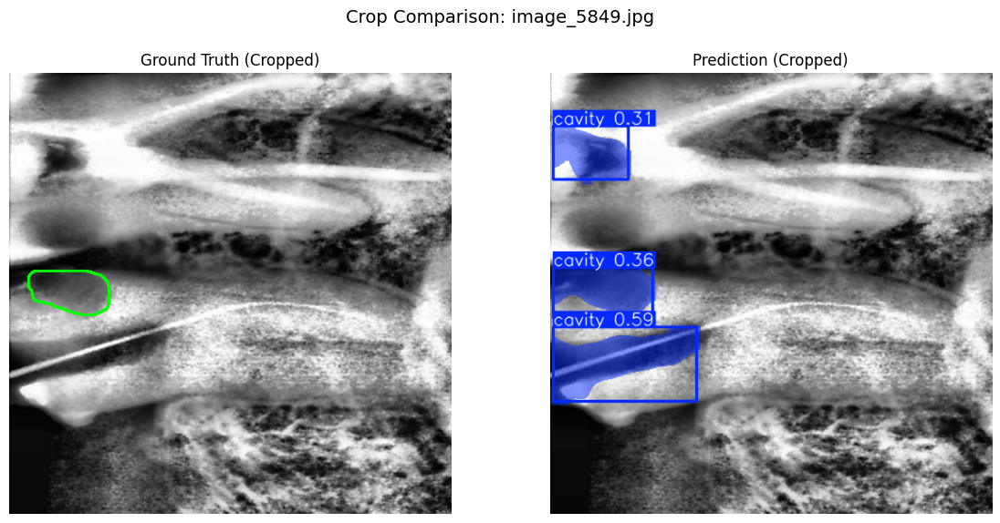


--- Processing Crop: image_5893.jpg ---
  Metrics (Crop): IoU=0.2304, Dice=0.3745, PixelAcc=0.9483


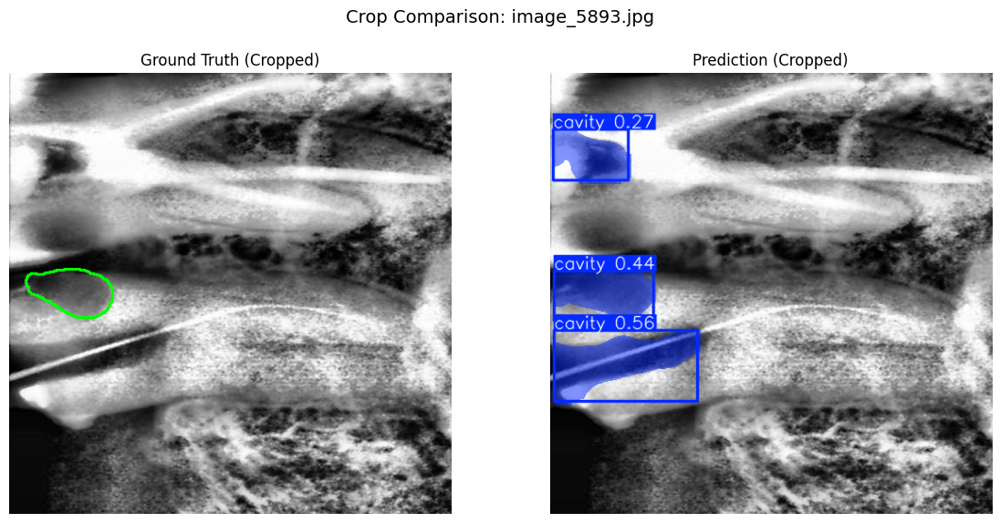


--- Processing Crop: image_5896.jpg ---
  Metrics (Crop): IoU=0.6163, Dice=0.7626, PixelAcc=0.9930


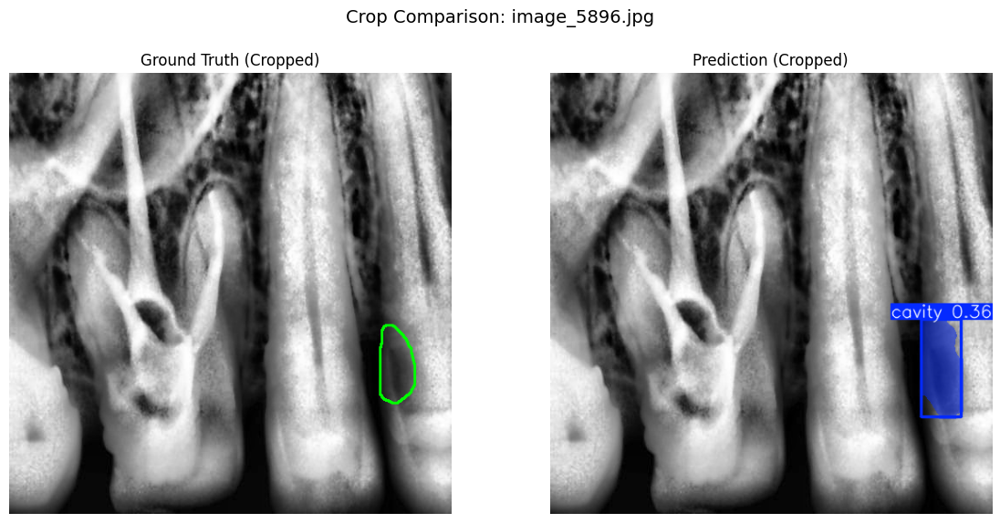


--- Processing Crop: image_5897.jpg ---
  Metrics (Crop): IoU=0.0000, Dice=0.0000, PixelAcc=0.9648


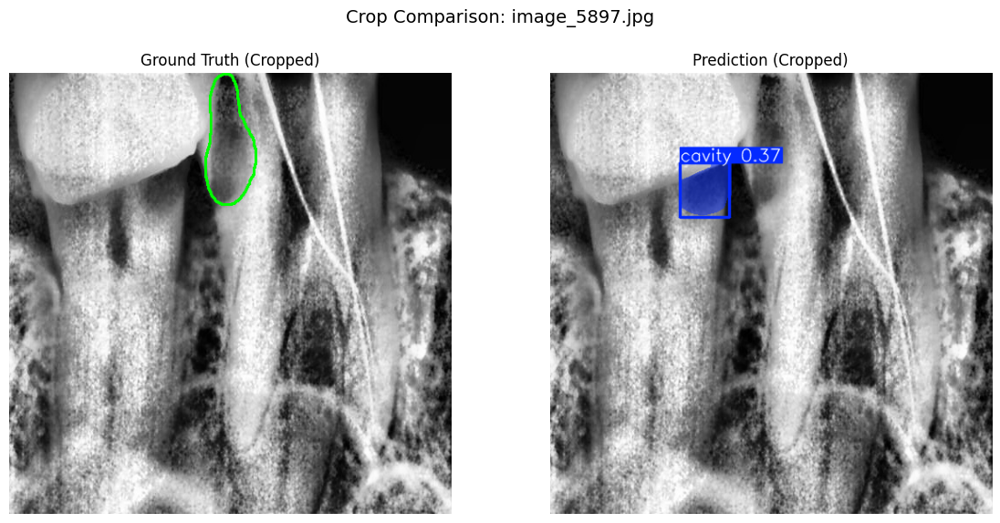


--- Processing Crop: image_5900.jpg ---
  Metrics (Crop): IoU=0.6193, Dice=0.7649, PixelAcc=0.9462


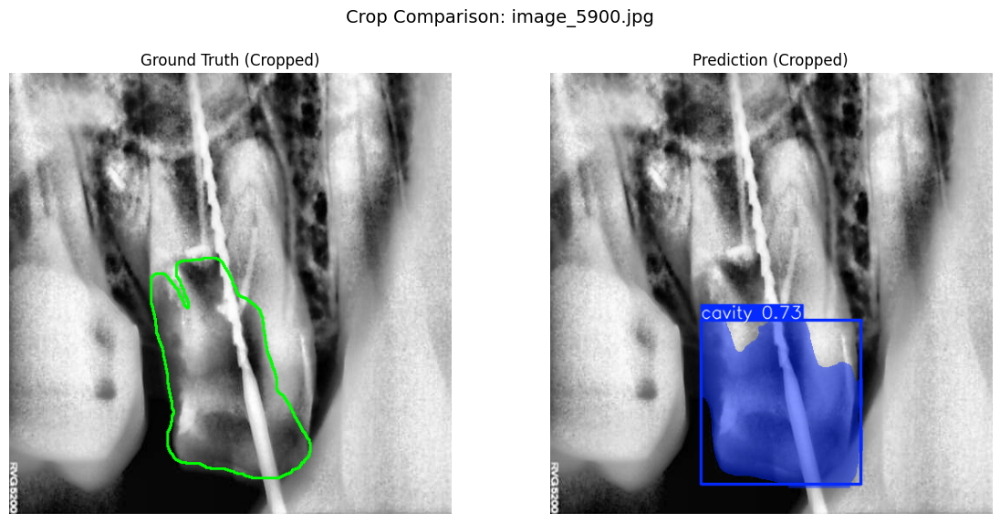


--- Processing Crop: image_5901.jpg ---
  Metrics (Crop): IoU=0.0000, Dice=0.0000, PixelAcc=0.9130


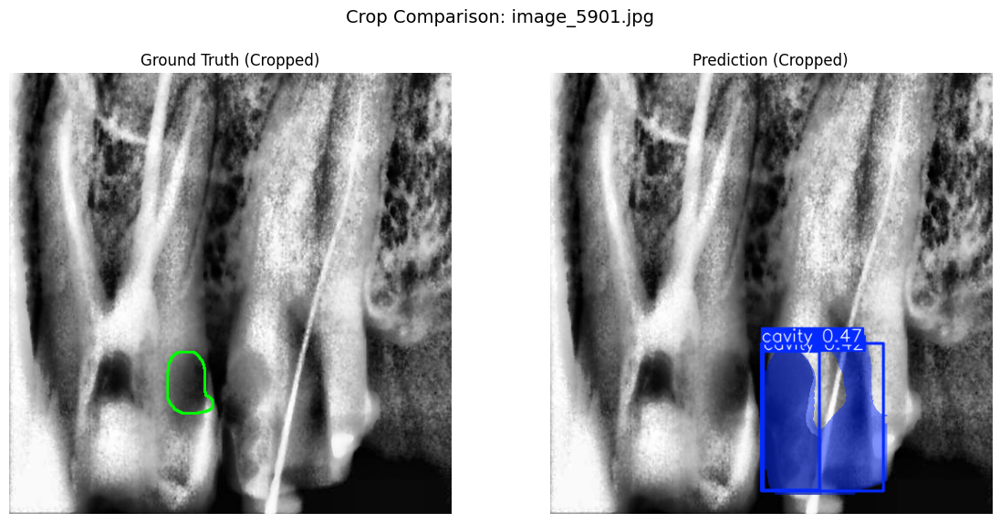


--- Processing Crop: image_5946.jpg ---
  Metrics (Crop): IoU=0.5541, Dice=0.7131, PixelAcc=0.9553


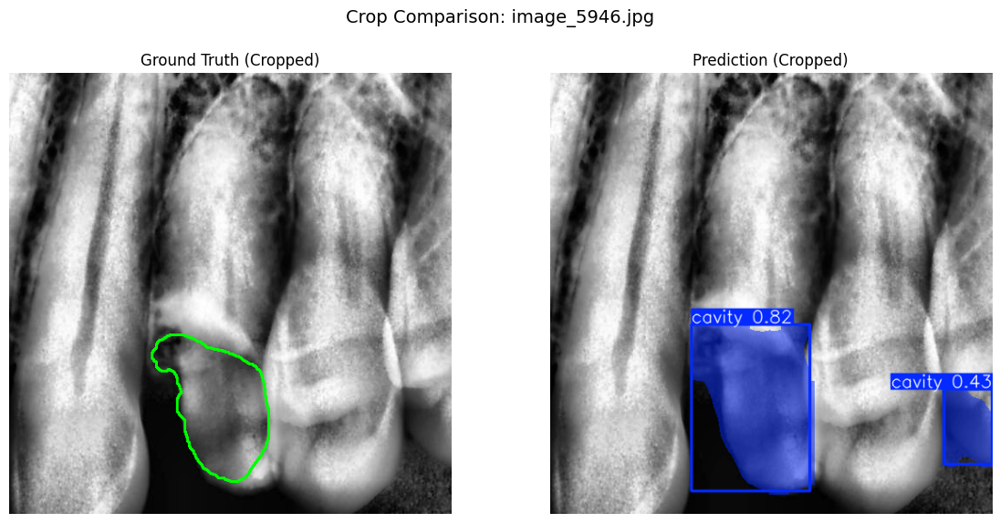


--- Processing Crop: image_5949.jpg ---
  Metrics (Crop): IoU=0.7548, Dice=0.8603, PixelAcc=0.9847


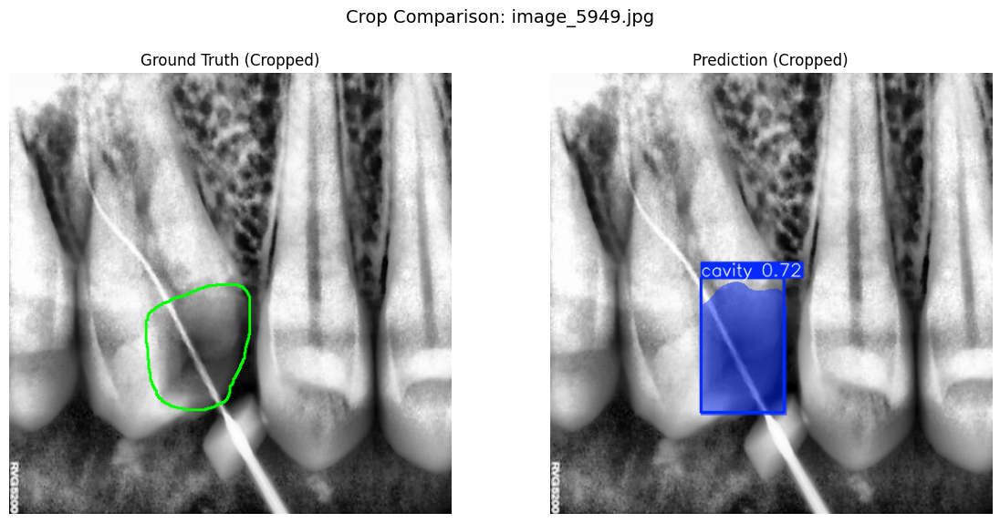


Creating zip file of visualizations...
Successfully created ccs_visualizations.zip in /kaggle/working/


In [11]:
#final visualisation
try:
    import sklearn.metrics
except ImportError:
    print("Installing scikit-learn...")
    !pip install scikit-learn -q
    import sklearn.metrics


import matplotlib.pyplot as plt

if 'model_ccs' not in globals():
    print("Error: Model 'model_ccs' not loaded. Run Cell 9 or load manually.")

else:

    val_img_dir_final = os.path.join(output_dir_ccs_yolo, 'images/val')
    ccs_mask_dir = os.path.join(ccs_output_dir, 'masks')
    vis_output_dir = os.path.join(base_working_dir, 'ccs_visualizations') 

    # --- Create Visualization Output Directory ---
    os.makedirs(vis_output_dir, exist_ok=True)
    print(f"Visualizations will be saved to: {vis_output_dir}")

    # --- Get sample validation CROPPED image paths ---
    sample_image_paths_ccs = sorted(glob.glob(os.path.join(val_img_dir_final, '*.jpg')))[:20] 

    if not sample_image_paths_ccs:
        print(f"Error: No validation images found in {val_img_dir_final}")
    else:
        print(f"\nRunning inference, calculating metrics, saving & displaying visualizations for {len(sample_image_paths_ccs)} sample crops...")
        results_list_ccs = model_ccs(sample_image_paths_ccs, imgsz=crop_size, conf=0.25, verbose=False)
        print("Inference complete.")

        # --- Loop through results ---
        for i, results in enumerate(tqdm(results_list_ccs, desc="Processing Samples")):
            current_cropped_path = sample_image_paths_ccs[i]
            base_filename = os.path.basename(current_cropped_path)
            name, _ = os.path.splitext(base_filename)
            gt_mask_filename = f"{name}.png"
            gt_cropped_mask_path = os.path.join(ccs_mask_dir, gt_mask_filename)

            print(f"\n--- Processing Crop: {base_filename} ---")

            # --- Load Cropped Image ---
            cropped_img_bgr = cv2.imread(current_cropped_path)
            if cropped_img_bgr is None:
                print("  Error: Could not load cropped image.")
                continue
            cropped_img_rgb = cv2.cvtColor(cropped_img_bgr, cv2.COLOR_BGR2RGB)

            # --- Prepare Prediction Visualization ---
            pred_vis_bgr = results.plot(conf=0.25)
            pred_vis_rgb = cv2.cvtColor(pred_vis_bgr, cv2.COLOR_BGR2RGB)

            gt_visualization_rgb = cropped_img_rgb.copy()
            gt_crop_binary = None
            if os.path.exists(gt_cropped_mask_path):
                gt_cropped_mask = cv2.imread(gt_cropped_mask_path, cv2.IMREAD_GRAYSCALE)
                if gt_cropped_mask is not None:
                    _, gt_crop_binary = cv2.threshold(gt_cropped_mask, 1, 1, cv2.THRESH_BINARY)
                    contours, _ = cv2.findContours(gt_cropped_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                    cv2.drawContours(gt_visualization_rgb, contours, -1, (0, 255, 0), 2)


            iou_score, dice_score, pixel_acc = 0.0, 0.0, 0.0
            if gt_crop_binary is not None:
                h_crop, w_crop = gt_crop_binary.shape
                pred_crop_mask = np.zeros((h_crop, w_crop), dtype=np.uint8)
                if results.masks is not None:
                    segments_norm = results.masks.xyn
                    for segment in segments_norm:
                        segment_denorm = segment * np.array([w_crop, h_crop])
                        contour = segment_denorm.astype(np.int32)
                        cv2.fillPoly(pred_crop_mask, [contour], 1)

                gt_flat = gt_crop_binary.flatten()
                pred_flat = pred_crop_mask.flatten()
                iou_score = sklearn.metrics.jaccard_score(gt_flat, pred_flat, pos_label=1, average='binary', zero_division=0)
                dice_score = sklearn.metrics.f1_score(gt_flat, pred_flat, pos_label=1, average='binary', zero_division=0)
                pixel_acc = sklearn.metrics.accuracy_score(gt_flat, pred_flat)
                print(f"  Metrics (Crop): IoU={iou_score:.4f}, Dice={dice_score:.4f}, PixelAcc={pixel_acc:.4f}")
            else:
                print("  Metrics (Crop): Cannot calculate without valid GT mask.")

            fig, axes = plt.subplots(1, 2, figsize=(12, 6))

            axes[0].imshow(gt_visualization_rgb) # Show GT Image + Contours
            axes[0].set_title('Ground Truth (Cropped)')
            axes[0].axis('off')

            axes[1].imshow(pred_vis_rgb) # Show Prediction Image + Masks/Boxes
            axes[1].set_title('Prediction (Cropped)')
            axes[1].axis('off')

            plt.suptitle(f"Crop Comparison: {base_filename}", fontsize=14)
            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show() # Display inline in notebook output

            # Add titles directly to images before combining for saving
            pad = 10; title_font_scale = 0.6; title_font_thickness = 1
            # Make copies to avoid drawing text on images used by matplotlib above
            gt_vis_save = gt_visualization_rgb.copy()
            pred_vis_save = pred_vis_rgb.copy()
            cv2.putText(gt_vis_save, 'Ground Truth (Crop)', (pad, pad*3), cv2.FONT_HERSHEY_SIMPLEX, title_font_scale, (0,255,0), title_font_thickness, cv2.LINE_AA)
            cv2.putText(pred_vis_save, 'Prediction (Crop)', (pad, pad*3), cv2.FONT_HERSHEY_SIMPLEX, title_font_scale, (0,255,255), title_font_thickness, cv2.LINE_AA) # Cyan title

            h1, w1 = gt_vis_save.shape[:2]; h2, w2 = pred_vis_save.shape[:2]
            if h1 == h2: # If heights match, stack directly
                comparison_img_rgb = np.hstack((gt_vis_save, pred_vis_save))
            else:
                target_h = max(h1, h2)
                if h1 == 0 or h2 == 0: continue # Skip if error
                gt_vis_resized = cv2.resize(gt_vis_save, (int(w1 * target_h / h1), target_h))
                pred_vis_resized = cv2.resize(pred_vis_save, (int(w2 * target_h / h2), target_h))
                comparison_img_rgb = np.hstack((gt_vis_resized, pred_vis_resized))

            comparison_img_bgr = cv2.cvtColor(comparison_img_rgb, cv2.COLOR_RGB2BGR)
            save_path = os.path.join(vis_output_dir, f"compare_{base_filename}")
            cv2.imwrite(save_path, comparison_img_bgr)

        print("\nCreating zip file of visualizations...")
        try:
            shutil.make_archive('ccs_visualizations', 'zip', vis_output_dir)
            print("Successfully created ccs_visualizations.zip in /kaggle/working/")
        except Exception as e:
            print(f"Error creating zip file: {e}")


In [12]:
from IPython.display import FileLink 
FileLink(r'yolo_training_runs/nooo-ccs_yolov8l-seg_crop512_claheTrue_lr0.0005_ep300/weights/best.pt')

/kaggle/working/yolo_training_runs/nooo-ccs_yolov8l-seg_crop512_claheTrue_lr0.0005_ep300/weights/best.pt